In [1]:
import kagglehub
import os


path = kagglehub.dataset_download("bhavikjikadara/dog-and-cat-classification-dataset")

print("The dataset is downloaded to:", path)

files = os.listdir(path)
print("Folder contents:", files)

C:\Users\mmapa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The dataset is downloaded to: C:\Users\mmapa\.cache\kagglehub\datasets\bhavikjikadara\dog-and-cat-classification-dataset\versions\1
Folder contents: ['PetImages']


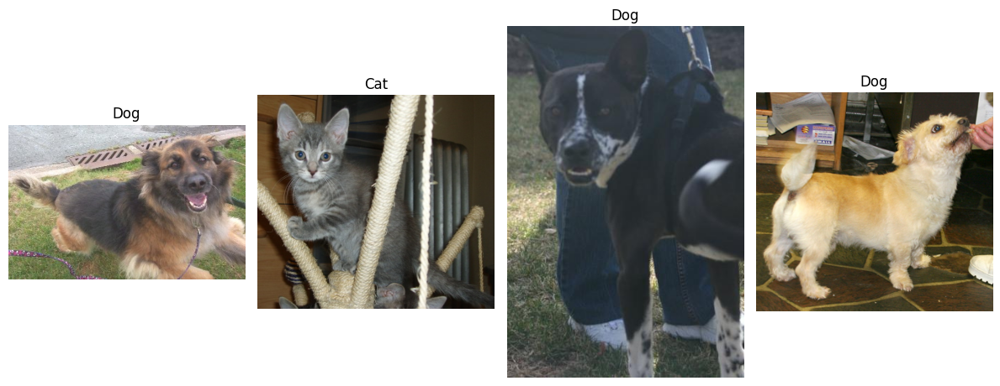

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import random


image_files = []
for root, dirs, files in os.walk(path):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_files.append(os.path.join(root, file))

#select 4 random images to display
sample_images = random.sample(image_files, 4)


plt.figure(figsize=(12, 8))
for i, img_path in enumerate(sample_images):
    plt.subplot(1, 4, i + 1)
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(os.path.basename(os.path.dirname(img_path))) 
    plt.axis('off')

plt.tight_layout()
plt.show()

In [3]:
import os  #jesli tu wyskoczy ['train', test'] to trzeba zmienic data_dir na data_dir = os.path.join(path, "train")
print("Folders found in main path:", os.listdir(path))

Folders found in main path: ['PetImages']


In [4]:
CATEGORIES = ["Cat", "Dog"] # The folder names
IMG_SIZE = 224 # Resize images to 224x224 (adjust as needed)
# 0 for cats, 1 for dogs

In [ ]:
import numpy as np
import os
import cv2
import random


if "train" in os.listdir(path):
    data_dir = os.path.join(path, "train")
elif "PetImages" in os.listdir(path):
    data_dir = os.path.join(path, "PetImages")
else:
    data_dir = path


training_data = []

def create_training_data():
    for category in CATEGORIES:
        path_to_cat = os.path.join(data_dir, category) 
        class_num = CATEGORIES.index(category) # 0 for cats, 1 for dogs

       
        for img in os.listdir(path_to_cat):
            try:
               
                img_array = cv2.imread(os.path.join(path_to_cat, img), cv2.IMREAD_COLOR)
                
                
                new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
                
                
                training_data.append([new_array, class_num])
            except Exception as e:
                # Some images might be broken/corrupt
                pass

create_training_data()


# 3. Create X and Y lists
X = []
y = []

for features, label in training_data:
    X.append(features)
    y.append(label)


X = np.array(X, dtype='float32').reshape(-1, IMG_SIZE, IMG_SIZE, 3)
y = np.array(y)

X = X / 255.0

print(f"X shape: {X.shape}")
print(f"Number of labels: {len(y)}")

X shape: (24946, 224, 224, 3)
Number of labels: 24946


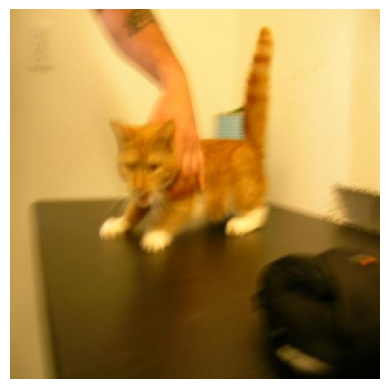

In [6]:
import matplotlib.pyplot as plt

#show the first image in X
img_to_show = X[0] 

img_to_show = cv2.cvtColor(np.float32(img_to_show), cv2.COLOR_BGR2RGB)

# 3. Display
plt.imshow(img_to_show)
plt.axis('off') # Optional: hides the axes
plt.show()

In [7]:
def resize_image(image_path, img_size=IMG_SIZE):  #resize a single image to the specified size
    try:
        
        img_array = cv2.imread(image_path)
        
        
        new_array = cv2.resize(img_array, (img_size, img_size))
        
        return new_array
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

In [8]:
def plot_image(image_array):   
    if image_array is None:
        print("Image is None, cannot plot.")
        return

    # FIX: Convert BGR (OpenCV) to RGB (Matplotlib)
    image_rgb = cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB)
    
    plt.imshow(image_rgb)
    plt.axis('off') 
    plt.show()

In [69]:
def resizeAll(image_paths):
    resized_images = []
    for p in image_paths:
        resized_images.append(resize_image(p).reshape(1, IMG_SIZE, IMG_SIZE, 3) / 255.0)
    return resized_images

In [12]:
y # 0 for cats, 1 for dogs

array([0, 0, 0, ..., 1, 1, 1])

In [13]:
X

array([[[[0.34117648, 0.6431373 , 0.79607844],
         [0.34901962, 0.6509804 , 0.8039216 ],
         [0.36078432, 0.6627451 , 0.8156863 ],
         ...,
         [0.4745098 , 0.79607844, 0.95686275],
         [0.48235294, 0.7921569 , 0.94509804],
         [0.4745098 , 0.78431374, 0.9372549 ]],

        [[0.34117648, 0.6431373 , 0.79607844],
         [0.34901962, 0.6509804 , 0.8039216 ],
         [0.36078432, 0.6627451 , 0.8156863 ],
         ...,
         [0.47843137, 0.8039216 , 0.9529412 ],
         [0.48235294, 0.7921569 , 0.94509804],
         [0.4745098 , 0.7882353 , 0.9372549 ]],

        [[0.34117648, 0.6431373 , 0.79607844],
         [0.34901962, 0.6509804 , 0.8039216 ],
         [0.36078432, 0.6627451 , 0.8156863 ],
         ...,
         [0.48235294, 0.8039216 , 0.9529412 ],
         [0.4862745 , 0.79607844, 0.9490196 ],
         [0.47843137, 0.7882353 , 0.9411765 ]],

        ...,

        [[0.21960784, 0.48235294, 0.6039216 ],
         [0.22352941, 0.48235294, 0.60784316]

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)

In [15]:
import tensorflow as tf

In [21]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1), # Rotate by +/- 10%
    tf.keras.layers.RandomZoom(0.1),     # Zoom in/out by +/- 10%
])

CNN_Cat_Dog_Model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=7,strides=2, padding="valid",
                           activation="relu", kernel_initializer="he_normal"),
    data_augmentation,
     tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Lambda(tf.nn.local_response_normalization),
    tf.keras.layers.Conv2D(64, kernel_size=3, padding="valid",
                           activation="relu", kernel_initializer="he_normal"),
     tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128, kernel_size=3, padding="valid",
                           activation="relu", kernel_initializer="he_normal"),
                            tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Lambda(tf.nn.local_response_normalization),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(128, kernel_size=3, padding="same",
                           activation="relu", kernel_initializer="he_normal"),
                            tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128, kernel_size=3, padding="same",
                           activation="relu", kernel_initializer="he_normal"),
    tf.keras.layers.MaxPool2D(),                       
    tf.keras.layers.Conv2D(128, kernel_size=3, padding="same",
                           activation="relu", kernel_initializer="he_normal"),   
                            tf.keras.layers.BatchNormalization(),                    
    #tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(128, activation="relu",
                          kernel_initializer="he_normal"),
    
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(64, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(2, activation="softmax")


])

In [26]:
optimizer = tf.keras.optimizers.Adam(learning_rate=2e-3)
CNN_Cat_Dog_Model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=10,
                                                     restore_best_weights=True)

In [87]:
history = CNN_Cat_Dog_Model.fit(X_train, y_train, epochs=15, validation_data=(X_valid, y_valid), callbacks=[early_stopping_cb])

Epoch 1/15
585/585 [==============================] - 414s 707ms/step - loss: 0.1153 - accuracy: 0.9555 - val_loss: 0.2017 - val_accuracy: 0.9270
Epoch 2/15
585/585 [==============================] - 391s 668ms/step - loss: 0.1165 - accuracy: 0.9561 - val_loss: 0.2356 - val_accuracy: 0.9110
Epoch 3/15
585/585 [==============================] - 383s 654ms/step - loss: 0.1128 - accuracy: 0.9570 - val_loss: 0.1561 - val_accuracy: 0.9389
Epoch 4/15
585/585 [==============================] - 424s 724ms/step - loss: 0.1129 - accuracy: 0.9571 - val_loss: 0.1922 - val_accuracy: 0.9256
Epoch 5/15
585/585 [==============================] - 453s 775ms/step - loss: 0.1150 - accuracy: 0.9570 - val_loss: 0.2538 - val_accuracy: 0.9027
Epoch 6/15
585/585 [==============================] - 456s 779ms/step - loss: 0.1122 - accuracy: 0.9565 - val_loss: 0.1701 - val_accuracy: 0.9402
Epoch 7/15
585/585 [==============================] - 426s 728ms/step - loss: 0.1079 - accuracy: 0.9604 - val_loss: 0.2169 -

In [92]:
history2 = CNN_Cat_Dog_Model.fit(X_train, y_train, epochs=15, validation_data=(X_valid, y_valid), callbacks=[early_stopping_cb])

Epoch 1/15
585/585 [==============================] - 420s 716ms/step - loss: 0.0913 - accuracy: 0.9655 - val_loss: 0.1449 - val_accuracy: 0.9473
Epoch 2/15
585/585 [==============================] - 444s 759ms/step - loss: 0.0900 - accuracy: 0.9653 - val_loss: 0.2107 - val_accuracy: 0.9218
Epoch 3/15
585/585 [==============================] - 431s 736ms/step - loss: 0.0891 - accuracy: 0.9665 - val_loss: 0.2536 - val_accuracy: 0.9160
Epoch 4/15
585/585 [==============================] - 424s 724ms/step - loss: 0.0850 - accuracy: 0.9670 - val_loss: 0.2848 - val_accuracy: 0.9158
Epoch 5/15
585/585 [==============================] - 414s 708ms/step - loss: 0.0877 - accuracy: 0.9663 - val_loss: 0.1819 - val_accuracy: 0.9347
Epoch 6/15
585/585 [==============================] - 412s 704ms/step - loss: 0.0847 - accuracy: 0.9696 - val_loss: 0.2563 - val_accuracy: 0.9081
Epoch 7/15
585/585 [==============================] - 398s 681ms/step - loss: 0.0800 - accuracy: 0.9699 - val_loss: 0.1876 -

model is trained sufficiently


195/195 [==============================] - 21s 105ms/step


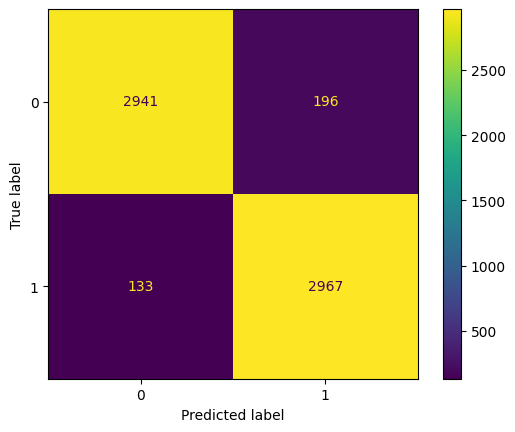

In [93]:
y_pred = CNN_Cat_Dog_Model.predict(X_valid)
y_pred_classes = np.argmax(y_pred, axis=1)

# Create confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_valid, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [94]:
CNN_Cat_Dog_Model.evaluate(X_valid, y_valid)

195/195 [==============================] - 20s 104ms/step - loss: 0.1449 - accuracy: 0.9473


[0.14488184452056885, 0.9472503066062927]

In [66]:
from matplotlib import image as mpimg
def plot_with_labels(image_array, predictions):
    n = len(predictions)
    for i in range(n):
        #plot_image(image_array[i])  # Assuming plot_image is defined to show the image
        toprint = mpimg.imread(image_array[i])
        imgplot = plt.imshow(toprint)
        plt.axis('off')  # Hide the axes
        if predictions[i][0] > predictions[i][1]:  
            plt.title("Cat  " + str(round(predictions[i][0]*100, 3)) + "%")
        else: 
            plt.title("Dog  " + str(round(predictions[i][1]*100, 3)) + "%")
        plt.show()


In [ ]:
folder_name = 'KotPies'


imagespaths = [
    os.path.join(folder_name, f) for f in os.listdir(folder_name) 
    if f.lower().endswith('.jpg')
]

print(f"Found {len(imagespaths)} images:")

ready_images = resizeAll(imagespaths)
ready_batch = np.array(ready_images, dtype='float32')
if(ready_batch.shape[1] == 1):
    ready_batch = np.squeeze(ready_batch, axis=1)

all_predictions = CNN_Cat_Dog_Model.predict(ready_batch)



Found 50 images:
['KotPies\\AdobeStock_632673308.jpg', 'KotPies\\aussie.jpg', 'KotPies\\brudnypies.jpg', 'KotPies\\buldog.jpg', 'KotPies\\cav.jpg']
2/2 [==============================] - 0s 106ms/step
Predicted 50 images.


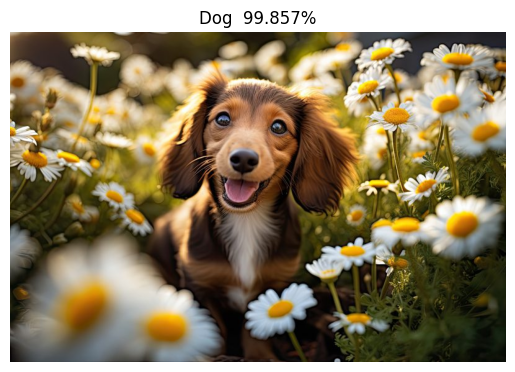

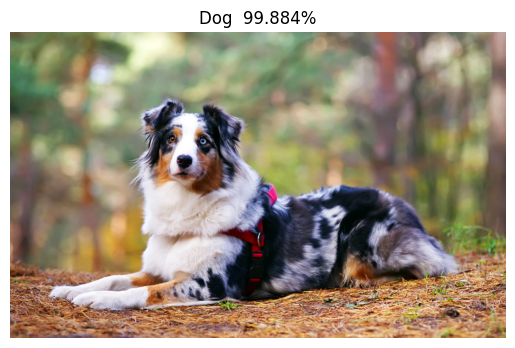

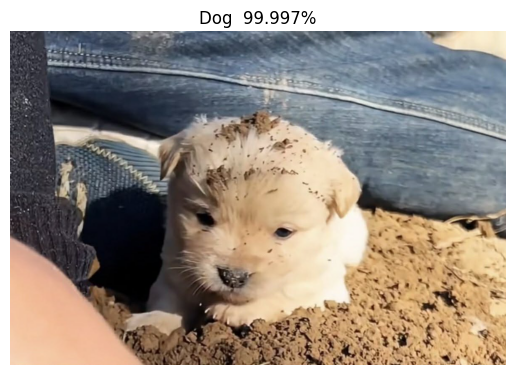

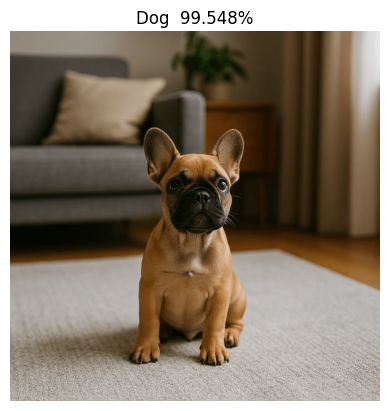

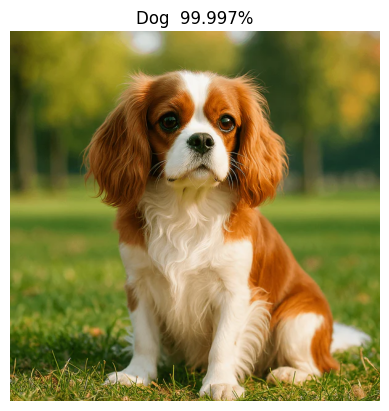

...

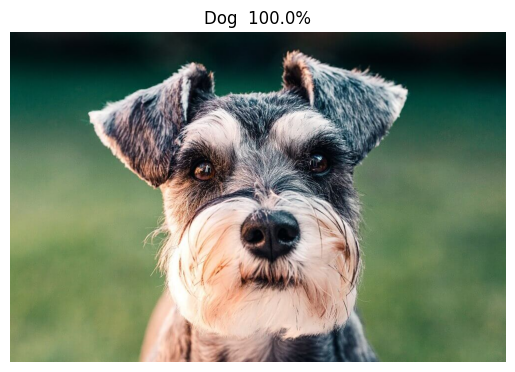

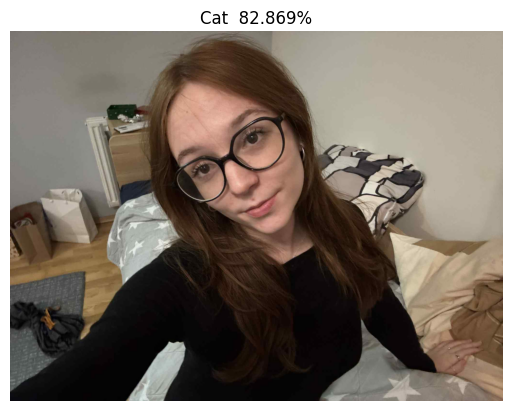

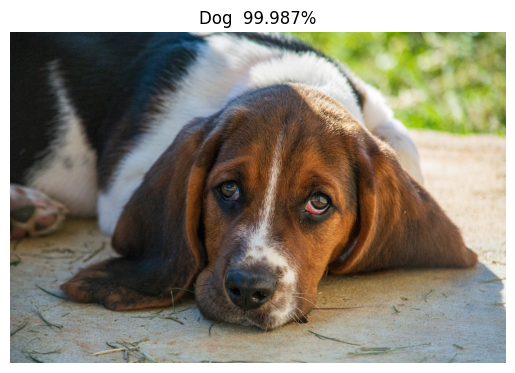

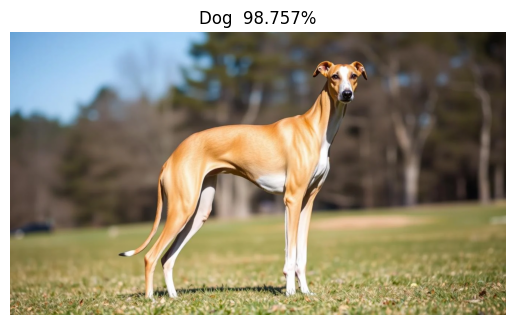

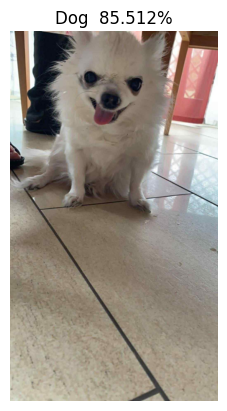

In [96]:
plot_with_labels(imagespaths, all_predictions)

In [97]:
CNN_Cat_Dog_Model.save("cat_dog_classifier_61epochs.h5", save_format='tf')

In [ ]:
#for i in range(N):
#    if y_pred_classes[i] != y_valid[i]:
#        plot_image(X_valid[i])
#        print("sure for prediction: " + str(y_pred[i][]) + "  real label: " + str(y_valid[i]))

6237
